In [2]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *

In [3]:
# def gaussian_filter(x, y, mu, cov):
    
#     dst = torch.dstack([torch.tensor(x.ravel()), torch.tensor(y.ravel())]).float().squeeze() - mu
 
#     # lower normal part of gaussian
#     normal = 1/(2 * torch.pi * torch.norm(cov))**(0.5)
    
#     print((torch.exp(-0.5*dst@torch.linalg.inv(cov))).shape, dst.T.shape)
#     # Calculating Gaussian filter
#     gauss = -0.5*dst@torch.linalg.inv(cov)
#     gauss2 = []
#     for i in range(gauss.shape[0]):
#         gauss2.append(gauss[i, :]@dst.T[:, i])

    
#     return (torch.exp(torch.tensor(gauss2))/normal).reshape(x.shape)

In [4]:
# mu = torch.tensor([0, -0.3])
# cov = torch.tensor([[1., 1.], 
#                     [1, 2]])

# plt.imshow(gaussian_filter(X, Y, mu, cov).detach().T)
# plt.colorbar()
# plt.grid()

In [5]:
def gaus2d(x=0, y=0, mx=0, my=0, sx=1, sy=1):
    return 1. / (2. * torch.pi * sx * sy) * torch.exp(-((x - mx)**2. / (2. * sx**2.) + (y - my)**2. / (2. * sy**2.)))

In [7]:
model = UNet(num_input_channels=1, num_output_channels=1) # postprocessor

# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T

wave_amp_coef = torch.tensor([30, 0., 0., 3, 3], requires_grad=True)

# coeffs = torch.rand(10, 1, requires_grad=True)
coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
# coeffs = torch.tensor([[ -13.53],
#         [-113.3250],
#         [ -12.7425],
#         [   4.4154],
#         [   6.2158],
#         [ -119.261],
#         [   2.3329],
#         [  1.3617],
#         [   1.5364],
#         [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)
obj_amp = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0_lens1493.npy')
abs_img = np.load('abs_0_lens1493.npy')

target_phase = torch.tensor(phase_img).T
target_abs = torch.tensor(abs_img).T

cons = torch.tensor(3.2, requires_grad=True)
# dist = torch.tensor(145.003) # mm 

optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': obj_amp, 'lr': 1e-1},
    {'params': wave_amp_coef, 'lr': 1e-2},
    {'params': coeffs, 'lr': 10},
    {'params': cons, 'lr': 1e-2},
    # {'params': dist, 'lr': 1e-2}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model.parameters(), 'lr': 2e-2}],
    lr=0.01, betas=(0.9, 0.999)
    )

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

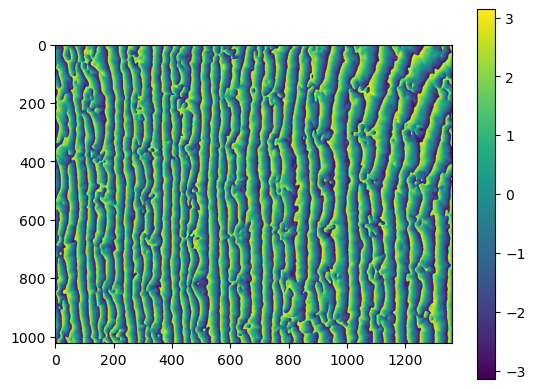

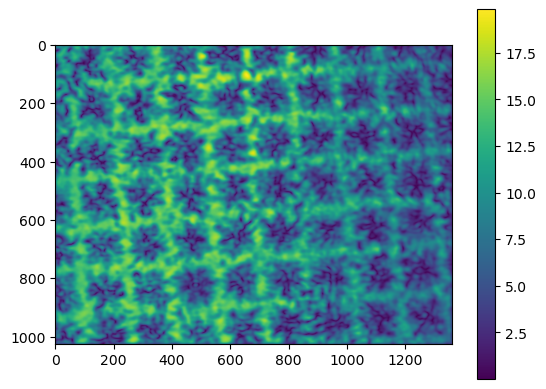

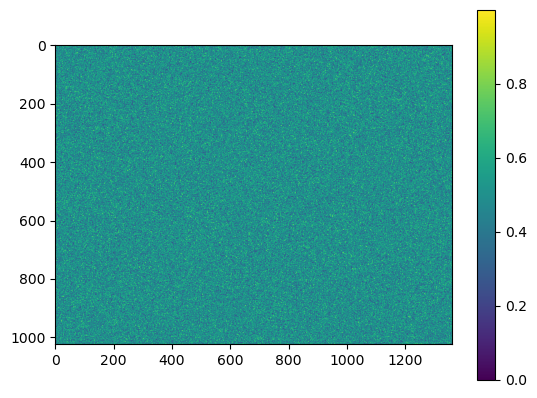

In [8]:
plt.imshow(target_phase.T)
plt.colorbar()
plt.show()

plt.imshow(target_abs.T)
plt.colorbar()
plt.show()

plt.imshow(obj_phase.detach())
plt.colorbar()
plt.show()

In [33]:
# obj_amp.shape, obj_phase.shape, wave.shape, wave_at_img.shape, target_abs.shape

0 0.37146305015542264


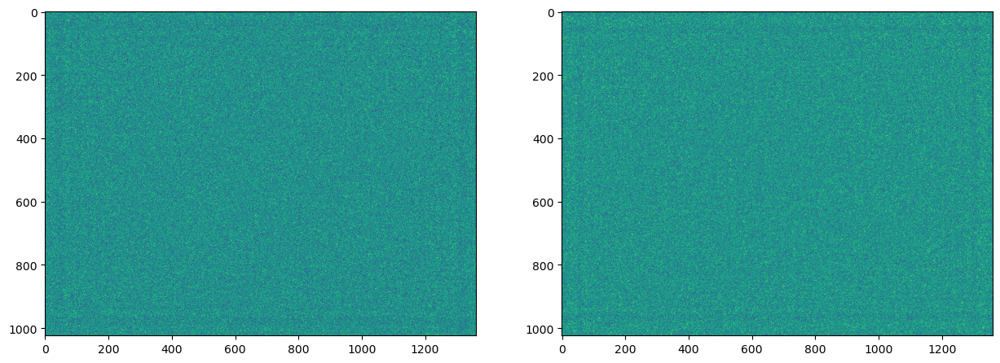

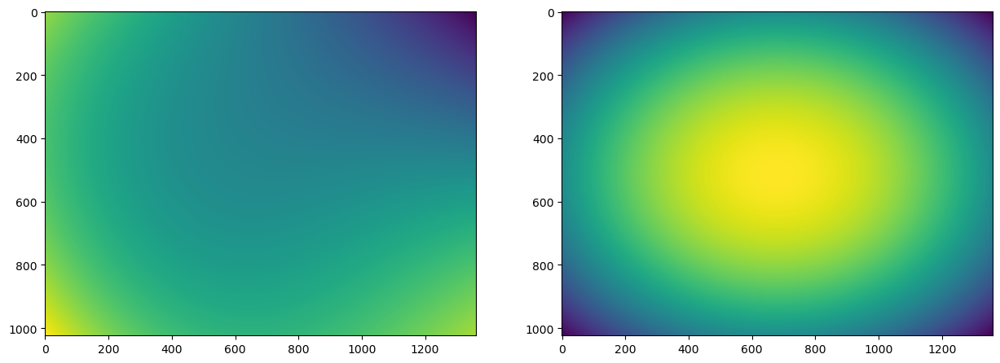

1 0.318700070872898
2 0.28611150282632153
3 0.28013520784314444
4 0.2789512528046927
5 0.27436879863941377
6 0.2671384477621408
7 0.2609594157580998
8 0.2542750262626606
9 0.2488463010736661
10 0.24658586010466454
11 0.24360792116397312
12 0.2409834732756778
13 0.23789609469957781
14 0.23549889152885872
15 0.23401683777940863
16 0.2313314374760706
17 0.23071462254031117
18 0.22990030959886243
19 0.22851854216398548
20 0.22650909178391104
21 0.22396128169875543
22 0.22277165580056352
23 0.22063244532045126
24 0.2240142546590835
25 0.2226466409910956
26 0.2230675471468819
27 0.2189860542517248
28 0.21822554453094253
29 0.2160019513478556
30 0.21444624633289258
31 0.21305005923586542
32 0.21117486102876082
33 0.21202241419463355
34 0.21117948017370639
35 0.21039944551638953
36 0.20942578655513033
37 0.2087528018152715
38 0.2076452123525694
39 0.20794601888612302
40 0.20717191360304385
41 0.2071584130518336
42 0.20519800088770723
43 0.2052853599851831
44 0.20518287731461687
45 0.2050440868

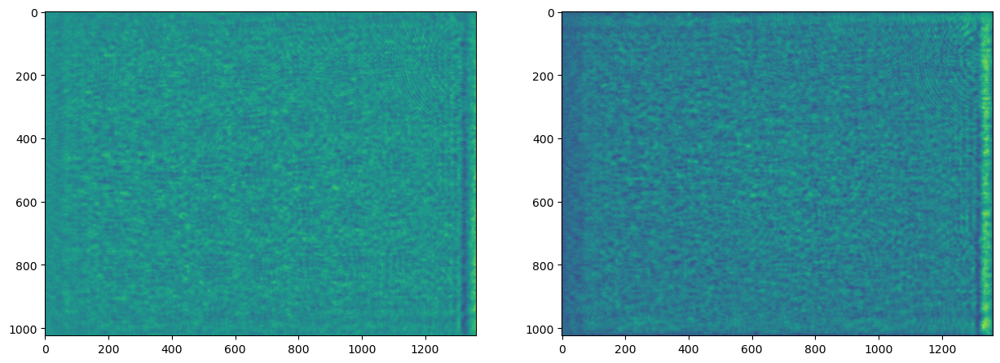

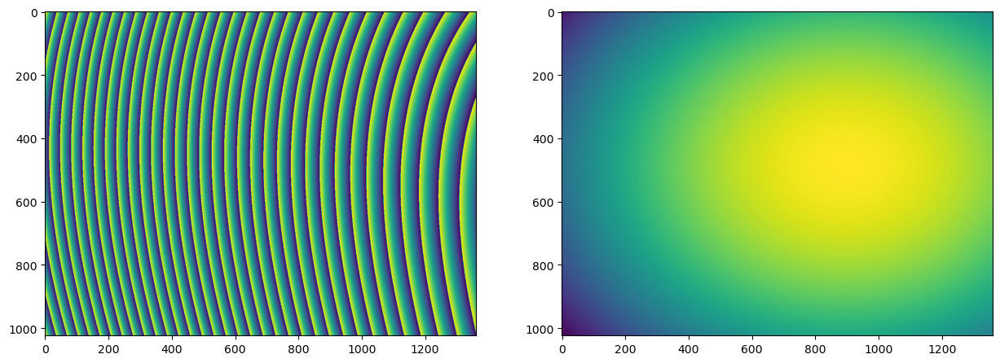

51 0.20175019781573608
52 0.20364071702139258
53 0.2004038014923794
54 0.19852306690806576
55 0.19902366777654662
56 0.19932377177329907
57 0.19669826611304744
58 0.1966072702340947
59 0.1974724360492304
60 0.19639682108522327
61 0.198292636880399
62 0.194897202863819
63 0.19734876970423146
64 0.19437077583919662
65 0.19606854252848877
66 0.19453679853178701
67 0.193379510708437
68 0.19411923404759274
69 0.19220185995145755
70 0.19364311684326374
71 0.19274937463199526
72 0.19698477861759173
73 0.19073477890354906
74 0.19280821958425015
75 0.19222221911860204
76 0.1919162914840501
77 0.18799096788318437
78 0.18882219675536596
79 0.18902500943151906
80 0.1872748353678532
81 0.1874258834822173
82 0.18875940242972447
83 0.18713948378346135
84 0.18449148089723727
85 0.18646158157607123
86 0.18691459069451338
87 0.18302741461162847
88 0.18204612733391368
89 0.1837589067205952
90 0.18226426137227258
91 0.18116055183502242
92 0.18128766362967896
93 0.1820534519196487
94 0.1852087954433338
95 

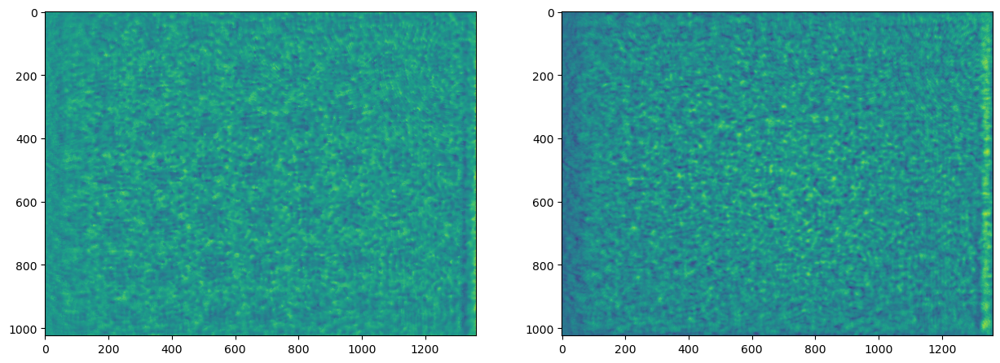

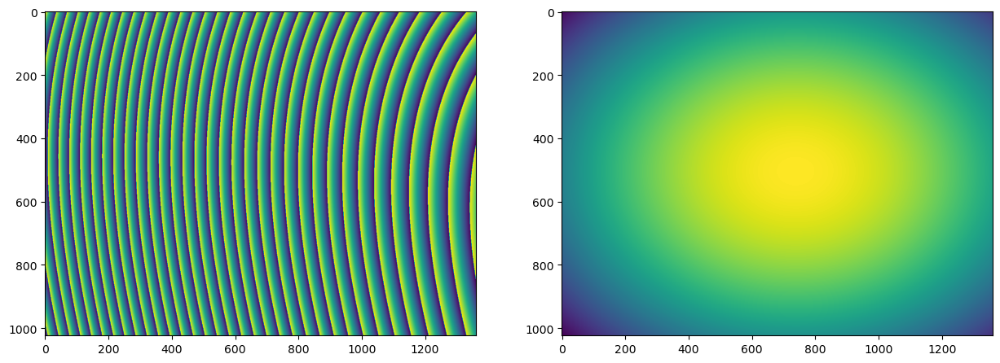

101 0.1736512195508809
102 0.17653530021215974
103 0.17749873026439436
104 0.17388459160016406
105 0.17470437905930003
106 0.17528669452179493
107 0.17198491141642175
108 0.17076094853339568
109 0.1720515111554496
110 0.17028051720535725
111 0.1689017470071867
112 0.17094830312471773
113 0.1692722662781005
114 0.16677047792371985
115 0.16563104543932108
116 0.16434478299716285
117 0.16579204897521643
118 0.16586487549468143
119 0.16332619362988146
120 0.1599894873170577
121 0.16038738824795412
122 0.16245159220694255
123 0.16218151405951328
124 0.15804689379980583
125 0.15460585252190195
126 0.15740170478165763
127 0.16184916402984084
128 0.15825870878953982
129 0.15899449416856692
130 0.1608776507891498
131 0.15054783796597576
132 0.15035317493284645
133 0.15476827731421225
134 0.1489177170135998
135 0.15165128359852478
136 0.15952543632575053
137 0.1498652290704085
138 0.14804760534798375
139 0.14981490679810944
140 0.14673123870012766
141 0.14618372986964823
142 0.14834665305560601


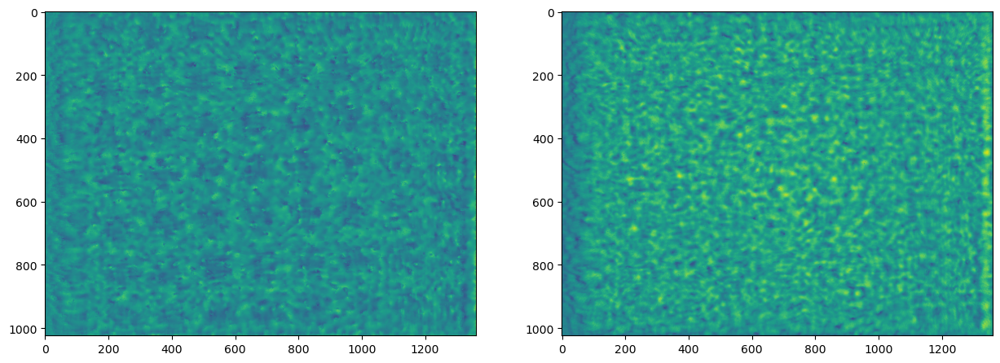

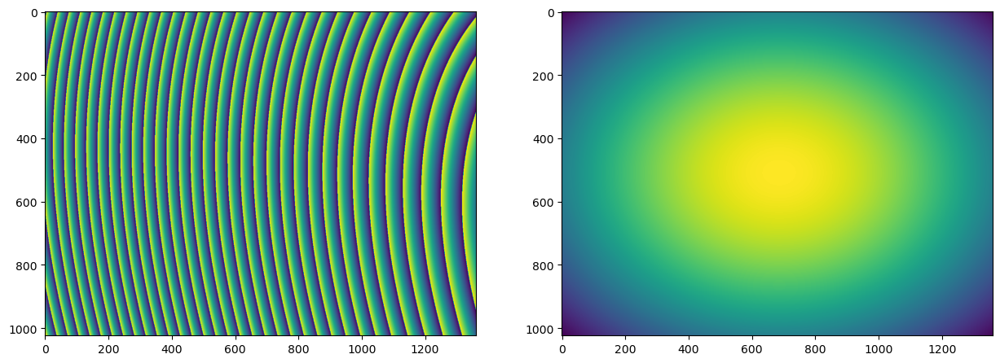

151 0.13567883682045834
152 0.1376962834313259
153 0.14111110801121432
154 0.1403106623498458
155 0.14387240902021198
156 0.13370206494742343
157 0.12791655779688615
158 0.13063875899581592
159 0.14321220480237373
160 0.1403438793068798
161 0.13116742511562296
162 0.13194691393494484
163 0.1331132958708671
164 0.13457191175772404
165 0.13060089491691435
166 0.12983759566934353
167 0.13136133503385128
168 0.1318958678090276
169 0.13182593804941592
170 0.12795639445710721
171 0.128948816505083
172 0.13184392598612488
173 0.1275320372242594
174 0.13598388640232312
175 0.1347625337364033
176 0.13094281491586984
177 0.12201344410707136
178 0.12369889552072973
179 0.13770107712385193
180 0.13056022392810535
181 0.12633638252605192
182 0.12846321998904203
183 0.1270791072989672
184 0.12556533286623392
185 0.12413401249114006
186 0.12523329483123943
187 0.1274048919452299
188 0.1197071026549952
189 0.11918625306760267
190 0.13130028436307217
191 0.13416753244450555
192 0.12898619655590118
193 

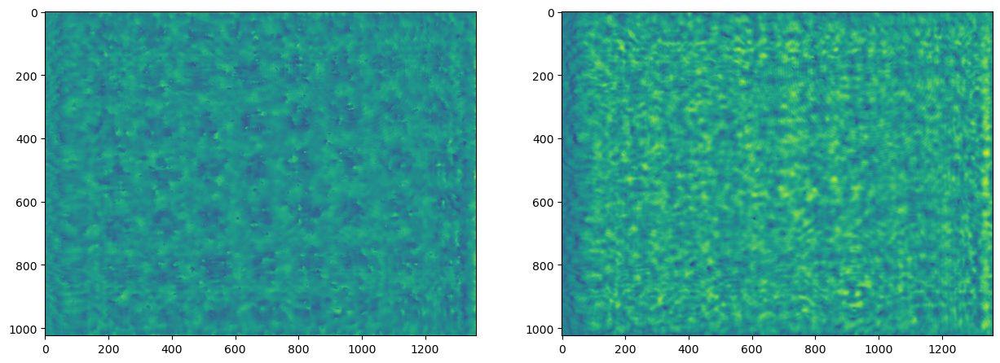

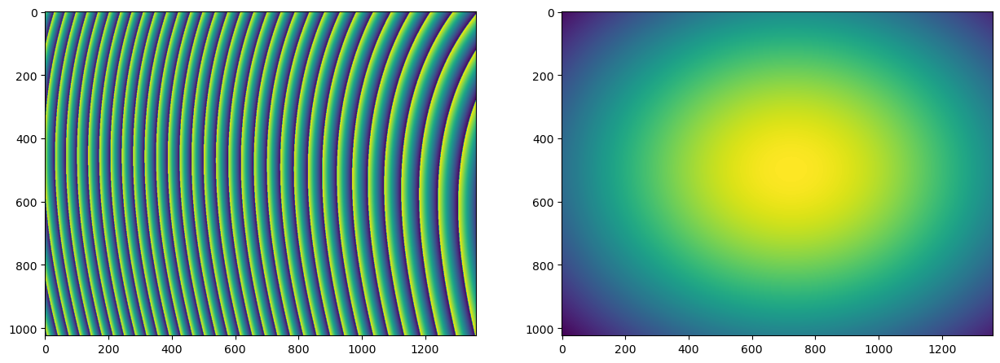

201 0.1195016999387652
202 0.12312217680788225
203 0.12226230133613274
204 0.11684213381046714
205 0.11625096610838204
206 0.11786808096435328
207 0.12205401603279697
208 0.12778705393906775
209 0.1293235964832515
210 0.11795576074414886
211 0.11709111957734275
212 0.11966583487180676
213 0.12311956947855751
214 0.1285552722337362
215 0.11835323813412406
216 0.12059114667568109
217 0.11813994982527071
218 0.12078620953372521
219 0.1218049858693012
220 0.11444196316707633
221 0.1257404476596633
222 0.12406958157191941
223 0.1207683355259008
224 0.11603784326955016
225 0.12434535641718021
226 0.12485695367420113
227 0.13008858492860956
228 0.118802844914601
229 0.12335082172069922
230 0.11555196706773932
231 0.12098574565463473
232 0.11598102135329792
233 0.11911203270003015
234 0.11707882663043304
235 0.11430383701704644
236 0.12353810171556923
237 0.11483504820361662
238 0.11484992584553119
239 0.116404684889405
240 0.11462270600025502
241 0.11946254934997344
242 0.11320925438630577
24

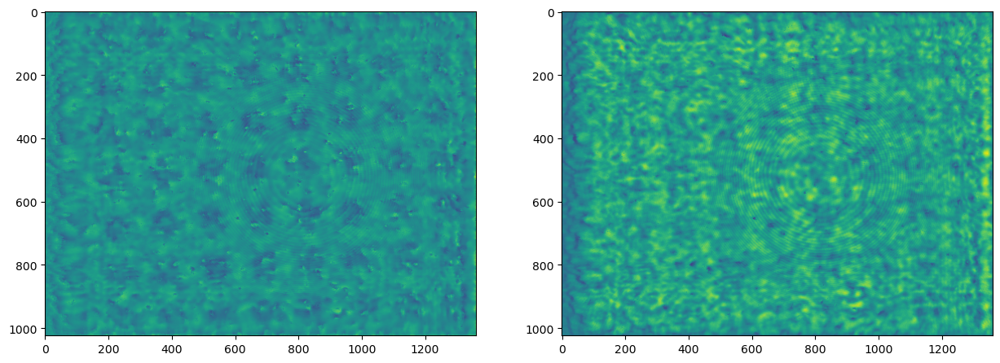

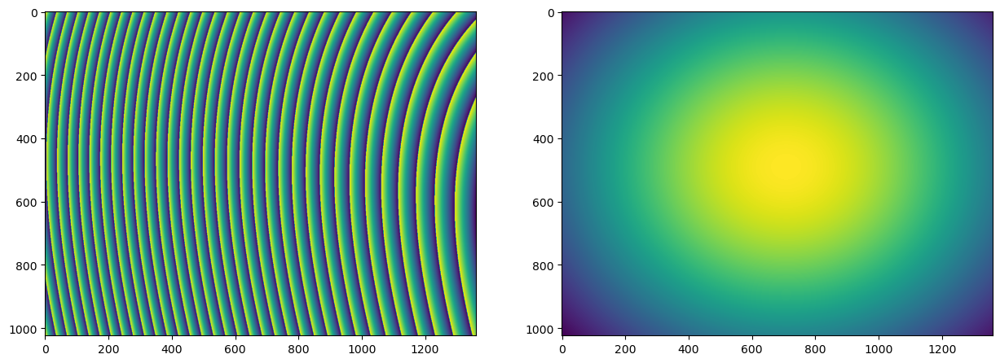

251 0.11117670529760015
252 0.11202563444845615
253 0.11451588116415634
254 0.11815879010545208
255 0.11676425777899925
256 0.10937132849945587
257 0.1130991010229371
258 0.1117968093072981
259 0.11438179329273652
260 0.11058927316685105
261 0.10561311371862828
262 0.11104708279707218
263 0.1150206806647021
264 0.111050098400334
265 0.11188703778099357
266 0.11098683882519769
267 0.11695878855513067
268 0.11128071006106942
269 0.11451921898716959
270 0.11221879530422799
271 0.1122197134744673
272 0.10722939185096879
273 0.10966754379414337
274 0.11845700393499345
275 0.1068226092657599
276 0.10751183520294787
277 0.11349718955690022
278 0.11404495469383394
279 0.11227438143711307
280 0.10668367968696044
281 0.11224822182724063
282 0.10703999488670984
283 0.10567626044467077
284 0.1092005349856994
285 0.11345640989618144
286 0.10671934759162875
287 0.10542520396930571
288 0.109931902314477
289 0.10861082982285572
290 0.10347139245243779
291 0.10752034910916365
292 0.11665911087326679
29

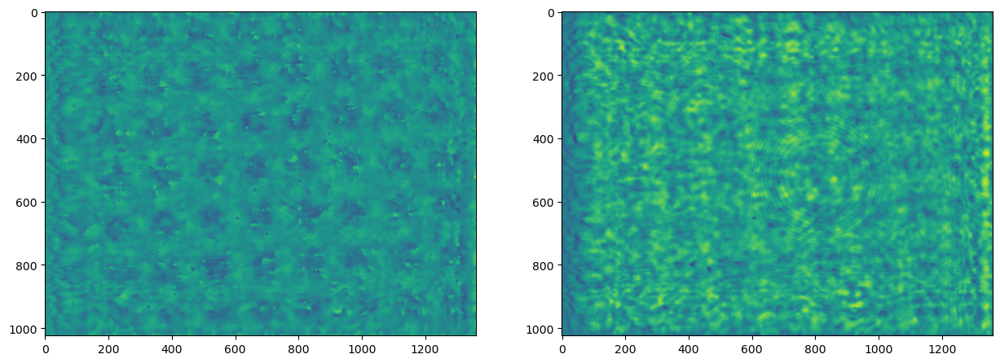

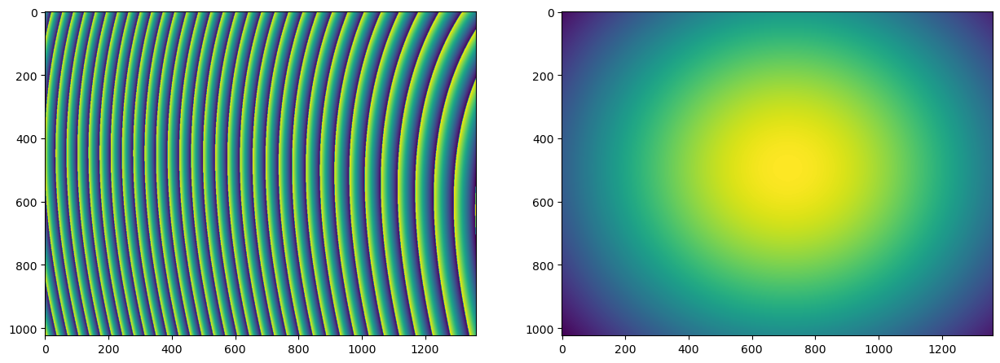

301 0.10901737492307982
302 0.10526854394723956
303 0.10756974958928071
304 0.10645794577701057
305 0.1076068534382283
306 0.11360276863136665
307 0.10605282971945554
308 0.11276963883638914
309 0.1129926575105443
310 0.10515141631262993
311 0.10794867300342503
312 0.1087003448374001
313 0.10455138618168612
314 0.10525149204218283
315 0.10396905023907291
316 0.11006189474447017
317 0.11339564727161175
318 0.11153915815386245
319 0.10313647237456246
320 0.10123743743171104
321 0.10531396542107901
322 0.11646387180342453
323 0.11355403876698167
324 0.10721456623232686
325 0.1094475657439293
326 0.11575201295841955
327 0.10705398072376612
328 0.10699218387184119
329 0.11181419792991616
330 0.10794092564556583
331 0.1064974210058188
332 0.10653326231021265
333 0.11052213072322344
334 0.10217866252120156
335 0.10090897218647044
336 0.10177895780192486
337 0.11049231975001814
338 0.10803740095160336
339 0.1015364546751725
340 0.1009825545065629
341 0.10087033845451264
342 0.10101173995585724

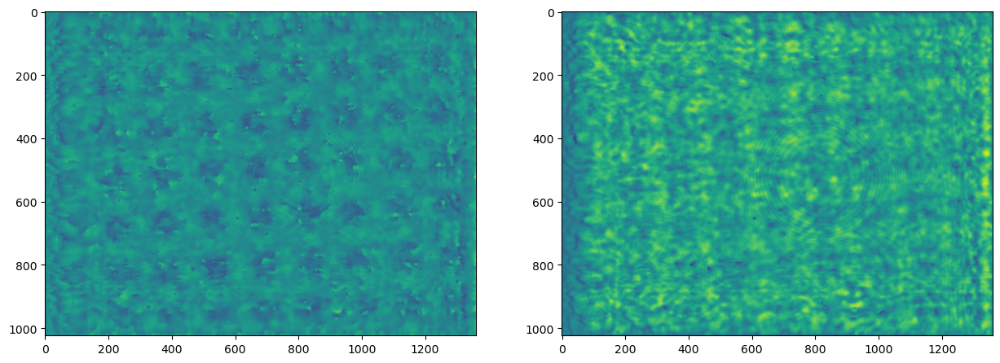

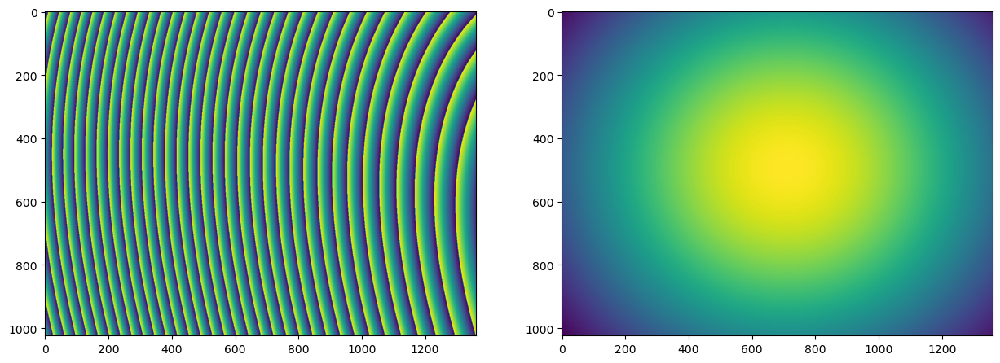

351 0.10279466331093551
352 0.1036994793507365
353 0.10559813795976317
354 0.10001276303979396
355 0.10327438919910165
356 0.11219491930714792
357 0.10571829024166492
358 0.10889400396349183
359 0.10741040469077512
360 0.1053932558645899
361 0.10495116870565463
362 0.10347156810006541
363 0.10504535022433012
364 0.10552356309588878
365 0.10313056713358346
366 0.10202562043400434
367 0.1043326834808049
368 0.10089995175873533
369 0.10153582094750765
370 0.10052013260874434
371 0.10249842166790382
372 0.10385758254082285
373 0.09859510363580654
374 0.10114515495477136
375 0.11788441968597863
376 0.10360140915459241
377 0.10859686967264745
378 0.10387522632418358
379 0.11283850502077111
380 0.10777491775308858
381 0.10357339697330224
382 0.10478426696196852
383 0.1047794404874329
384 0.10684919669015802
385 0.10988083624720241
386 0.09950214087124079
387 0.09661894419939884
388 0.10776938457409524
389 0.0987995053422284
390 0.09879928637257297
391 0.10456772903059033
392 0.099899383757602

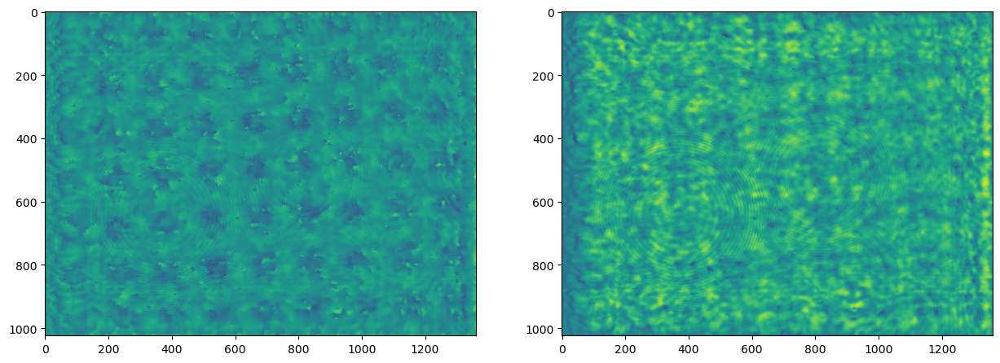

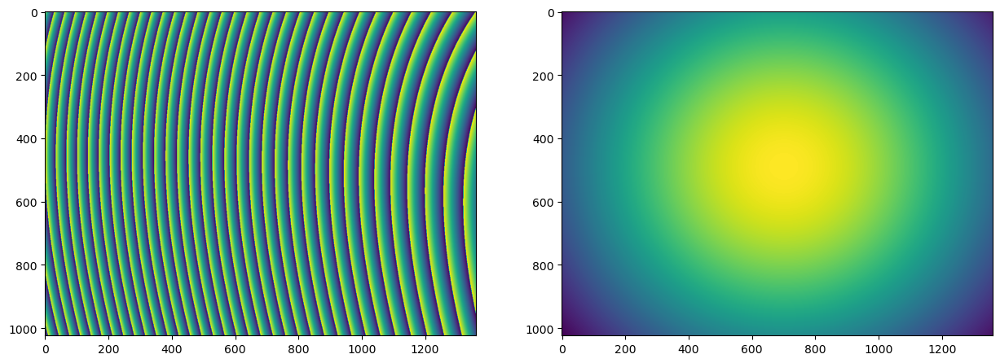

401 0.09802804764214448
402 0.09848420965780072
403 0.10069939288824839
404 0.10441664647537488
405 0.09513480055848664
406 0.10385946212638922
407 0.10113892270010046
408 0.10273919098675163
409 0.10559579676353714
410 0.10247754145732088
411 0.09751573297767005
412 0.09732636806492749
413 0.09977546314663532
414 0.09761119150249847
415 0.09426411363222008
416 0.1022500047816427
417 0.09783391351166193
418 0.09514143020613997
419 0.09812547922436005
420 0.10474665095310817
421 0.10442677361350569
422 0.10177639320098796
423 0.09531270017062765
424 0.09672969027488368
425 0.09487908175499558
426 0.09419138962431403
427 0.0949057446288423
428 0.09477450637908037
429 0.09535444242013956
430 0.09458052143995543
431 0.09429426857478354
432 0.1043394933218787
433 0.09896144300984794
434 0.09753381436646566
435 0.0985429362266241
436 0.1070075252200936
437 0.09686607005382417
438 0.09775399171116098
439 0.10340013062345328
440 0.09575603398195008
441 0.10012250542315268
442 0.094373186326234

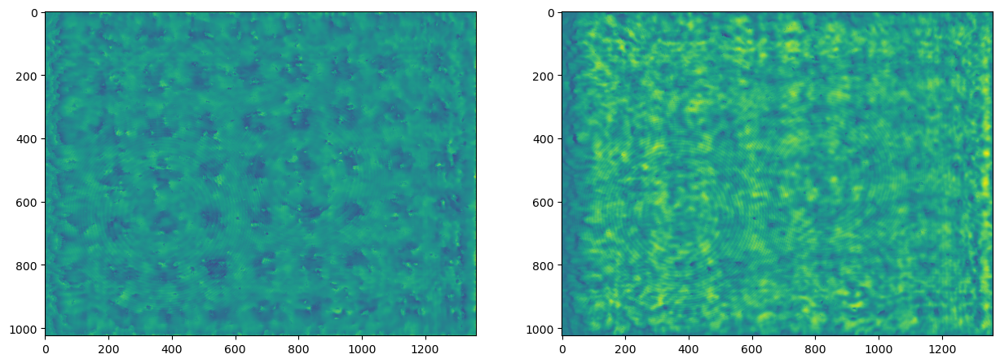

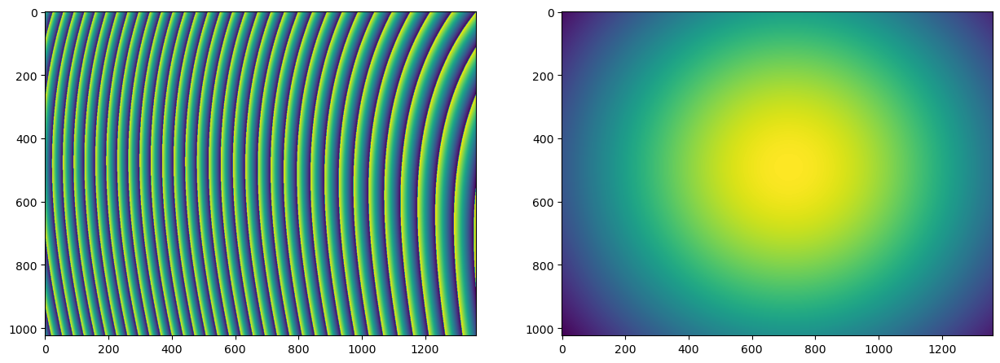

451 0.10085380870991303
452 0.09283190132196248
453 0.09171728357423219
454 0.0969303380714041
455 0.09560430201567163
456 0.09661463679631539
457 0.1059659508929905
458 0.09635618297820751
459 0.09850983692367574
460 0.09340689682006126
461 0.09247493791270536
462 0.09232180940925706
463 0.10066157205172002
464 0.09630595829276013
465 0.09396062752226504
466 0.10894133184646856
467 0.09832048970393806
468 0.10910465006238233
469 0.09415919789835947
470 0.11108817865063422
471 0.10131348751195157
472 0.1051672350229205
473 0.09477799614856569
474 0.10755876639949441
475 0.1002223888448589
476 0.10665388520800613
477 0.09659507706611833
478 0.11047702510415926
479 0.10270541304839652
480 0.0993671672687453
481 0.09597954764666797
482 0.10306746416149112
483 0.10205058754758178
484 0.10319683093622475
485 0.09751385806186633
486 0.1011777706489492
487 0.0941704566977325
488 0.09554295338321217
489 0.09772096408418807
490 0.09215072338191618
491 0.09545291698743394
492 0.10663577608568191

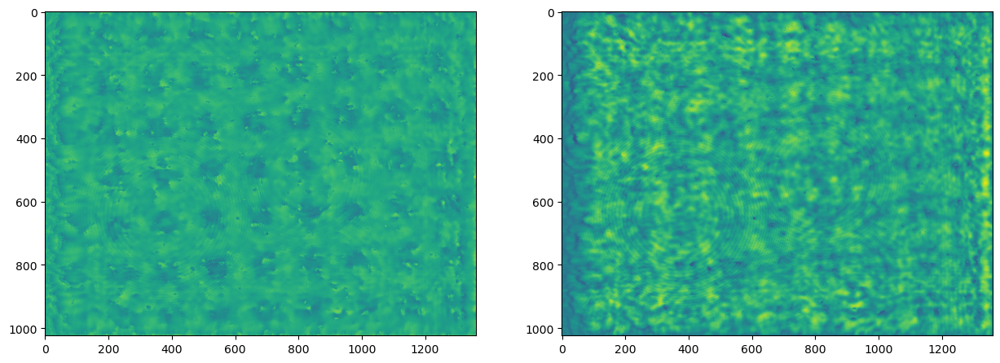

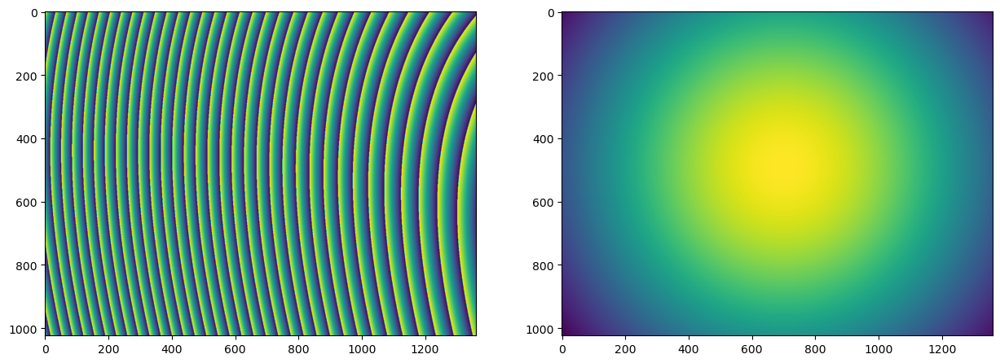

In [9]:
epochs = 501

loss_arr = []
loss_amp_arr = []
loss_phase_arr = []

wave_amp_coeff_train = []
wave_phase_coeff_train = []

for itr in range(epochs):

    optimizer.zero_grad()
    # optimizer_proc.zero_grad()

    obj = obj_amp*torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)

    wave_amp = wave_amp_coef[0]*gaus2d(torch.tensor(X), torch.tensor(Y), wave_amp_coef[1], wave_amp_coef[2], wave_amp_coef[3], wave_amp_coef[4]).T
    wave = wave_amp*torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    dist = torch.tensor(150.003) # mm
    wave_at_img = wave_obj.propogate(dist)
    wave_z = torch.angle(wave_at_img)
    wave_z += cons
    loss_phase = loss_fn(wave_z, target_phase)
    loss_amp = loss_fn(torch.abs(wave_at_img), target_abs)

    loss = 0.5*(loss_amp + loss_phase) 
    # + 0.5*(total_variation_loss(wave_z, 0.1) + total_variation_loss(torch.abs(wave_at_img), 0.1))

    # proc = model(obj_phase.unsqueeze(0).unsqueeze(0)).squeeze()
    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    # optimizer_proc.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1])

    loss_amp_arr.append(loss_amp.item())
    loss_phase_arr.append(loss_phase.item())

    wave_amp_coeff_train.append(wave_amp_coef.detach().clone())
    # print(wave_amp_coef.detach())
    wave_phase_coeff_train.append(coeffs.detach().clone())

    if (itr) % 50 == 0:

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[0].imshow(obj_phase.detach())
        # axs[1].imshow(proc.detach())
        axs[1].imshow(obj_amp.detach())
        plt.show()

        fig, axs = plt.subplots(1, 2, figsize=(15, 8))

        axs[0].imshow(torch.angle(wave.detach()))
        # axs[1].imshow(proc.detach())
        axs[1].imshow(torch.abs(wave.detach()))
        plt.show()
        

In [35]:
# wave_amp.shape, wave_amp_coef, wave_amp_coef.grad

In [36]:
# dist, cons.grad, coeffs.grad, coeffs

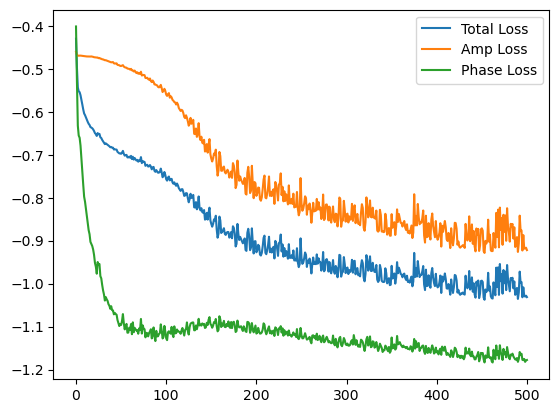

In [10]:
plt.plot(np.log10(loss_arr), label='Total Loss')
plt.plot(np.log10(loss_amp_arr), label='Amp Loss')
plt.plot(np.log10(loss_phase_arr), label='Phase Loss')

plt.legend()

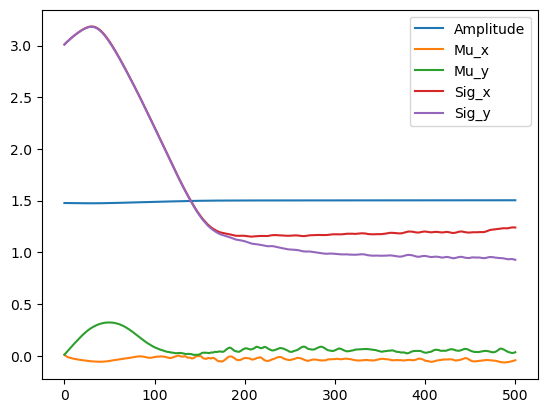

In [11]:
plt.plot(torch.log10(torch.stack(wave_amp_coeff_train)[:, 0]), label='Amplitude')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 1], label='Mu_x')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 2], label='Mu_y')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 3], label='Sig_x')
plt.plot(torch.stack(wave_amp_coeff_train)[:, 4], label='Sig_y')
plt.legend()

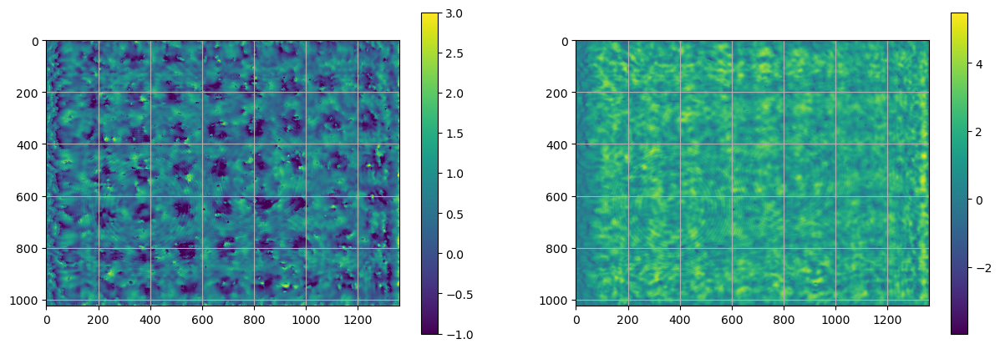

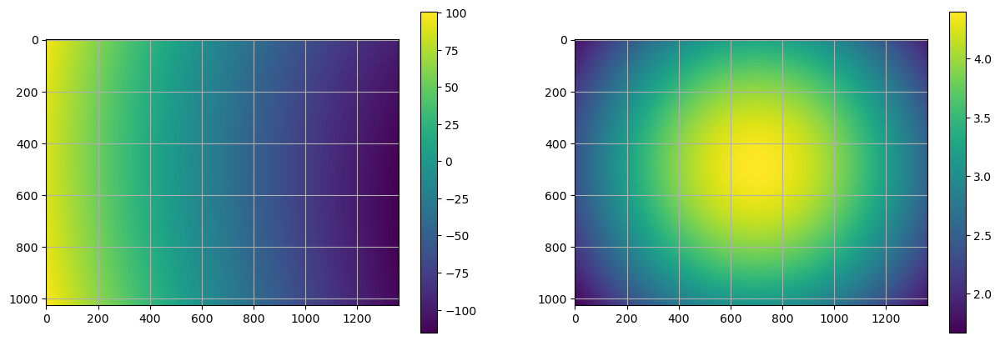

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()


fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(wave_amp.detach())
cm0 = axs[0].imshow(wave_phase.detach())
# , vmin=-30, vmax=3
fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

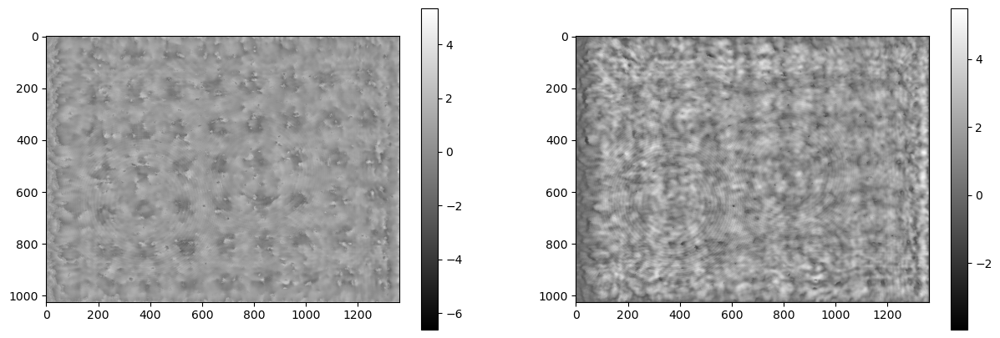

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach(), cmap='gray')
cm0 = axs[0].imshow(obj_phase.detach(), cmap='gray')

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

# axs[0].grid()
# axs[1].grid()

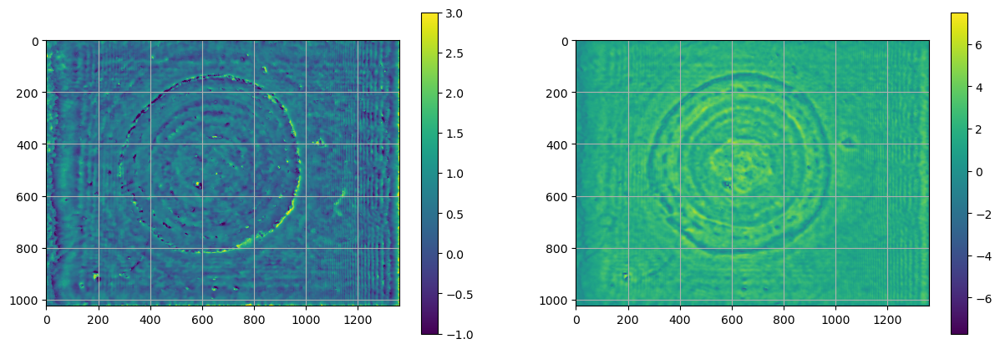

In [20]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

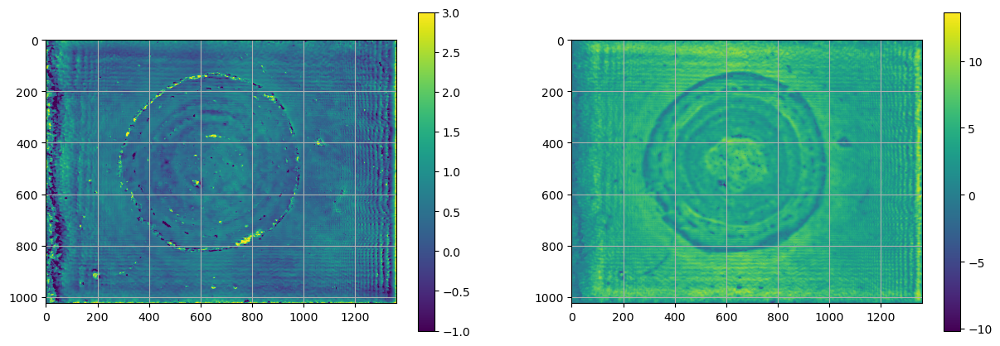

In [180]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

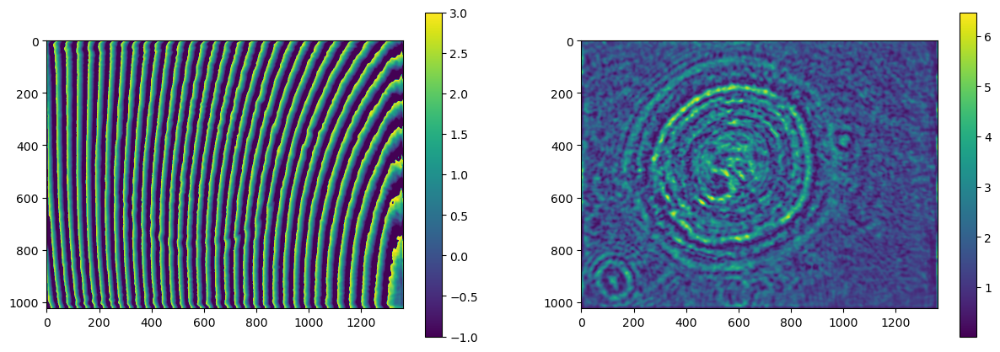

In [34]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

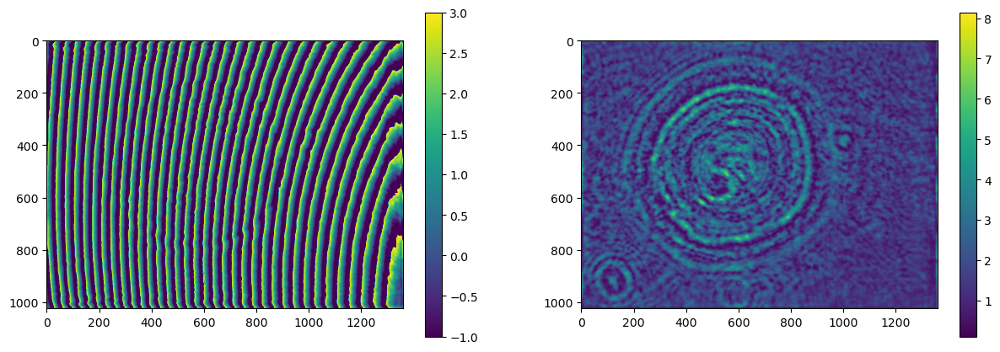

In [21]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

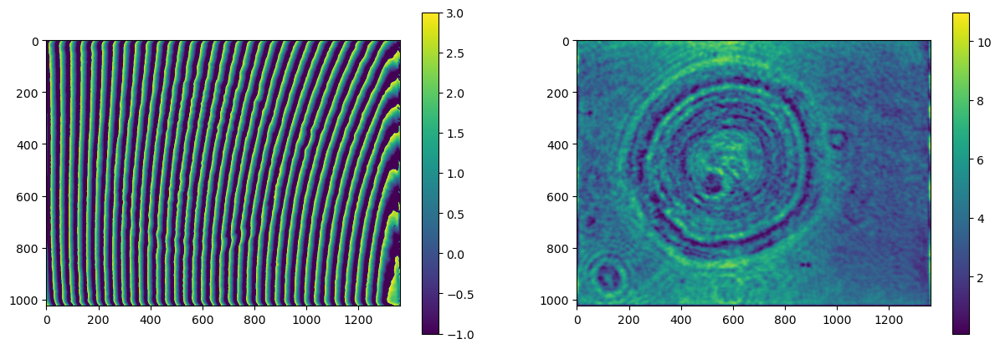

In [178]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

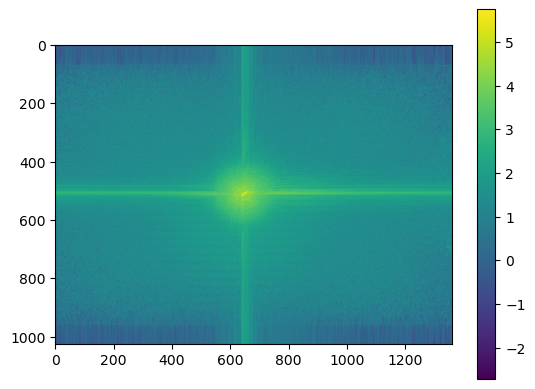

In [22]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

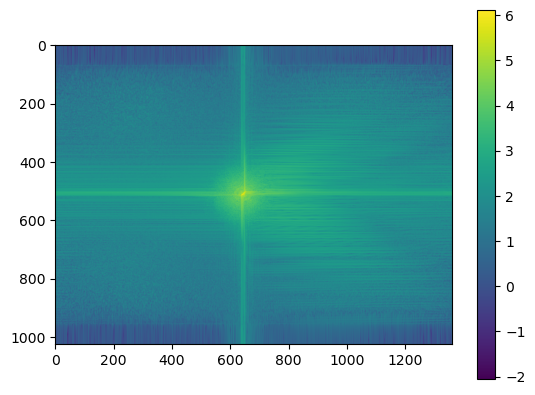

In [172]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

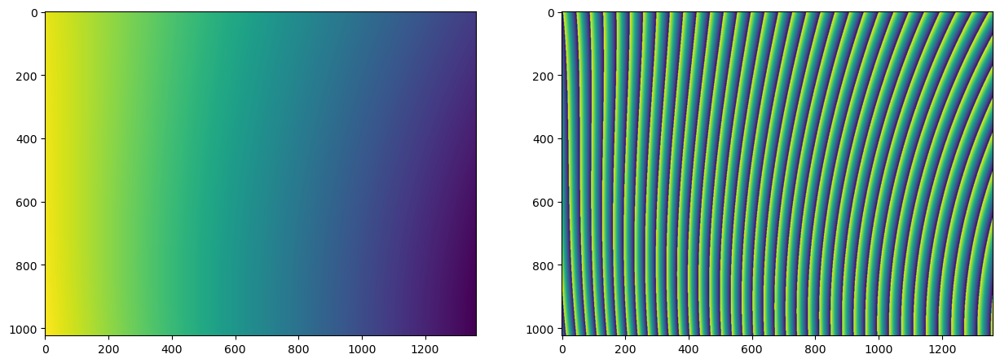

In [173]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

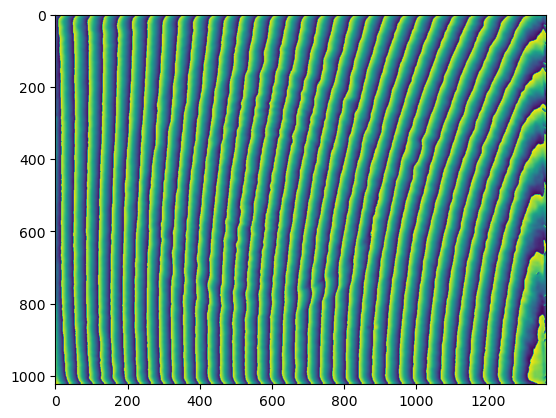

In [174]:
plt.imshow(wave_z.detach().T)

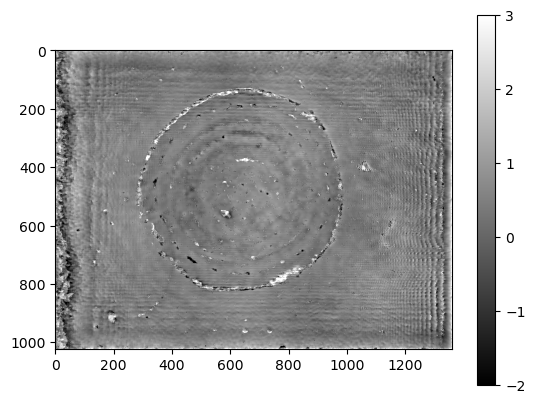

In [175]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()